# Logistic regression for Multiclass classification

## Iris Flower Classification

### Import libraries

In [270]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as pl
import seaborn as sns
import missingno as msno
import matplotlib.pyplot as pl
from scipy import stats
from scipy.stats import norm, skew
from dataprep.eda import create_report
from sklearn.metrics import confusion_matrix
from plotly.express import scatter_matrix, parallel_categories, scatter_3d
from pandas.plotting import andrews_curves, parallel_coordinates, radviz
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler

%config InlineBackend.figure_format = 'retina'
fs = (20,10)
pal = 'CMRmap_r'

import warnings
warnings.filterwarnings('ignore')

### load Data

In [271]:
df = pd.read_csv('iris.csv')
df.head()

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
0,1,5.1,3.5,1.4,0.2,Iris-setosa
1,2,4.9,3.0,1.4,0.2,Iris-setosa
2,3,4.7,3.2,1.3,0.2,Iris-setosa
3,4,4.6,3.1,1.5,0.2,Iris-setosa
4,5,5.0,3.6,1.4,0.2,Iris-setosa


In [272]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             150 non-null    int64  
 1   SepalLengthCm  150 non-null    float64
 2   SepalWidthCm   150 non-null    float64
 3   PetalLengthCm  150 non-null    float64
 4   PetalWidthCm   150 non-null    float64
 5   Species        150 non-null    object 
dtypes: float64(4), int64(1), object(1)
memory usage: 7.2+ KB


In [273]:
df.describe()

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm
count,150.000000,150.000000,150.000000,150.000000,150.000000
mean,75.500000,5.843333,3.054000,3.758667,1.198667
std,43.445368,0.828066,0.433594,1.764420,0.763161
min,1.000000,4.300000,2.000000,1.000000,0.100000
25%,38.250000,5.100000,2.800000,1.600000,0.300000
50%,75.500000,5.800000,3.000000,4.350000,1.300000
75%,112.750000,6.400000,3.300000,5.100000,1.800000
max,150.000000,7.900000,4.400000,6.900000,2.500000


### EDA

In [274]:
df.drop('Id', axis=1)

,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,Iris-virginica
146,6.3,2.5,5.0,1.9,Iris-virginica
147,6.5,3.0,5.2,2.0,Iris-virginica
148,6.2,3.4,5.4,2.3,Iris-virginica


In [275]:
df.isnull().sum()

Id               0
SepalLengthCm    0
SepalWidthCm     0
PetalLengthCm    0
PetalWidthCm     0
Species          0
dtype: int64

In [276]:
df.drop_duplicates(inplace=True)

In [277]:
df.sample()

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
53,54,5.5,2.3,4.0,1.3,Iris-versicolor


In [317]:
pd.DataFrame(df.Species.value_counts())

,Species
Iris-setosa,50
Iris-versicolor,50
Iris-virginica,50


<Axes: >

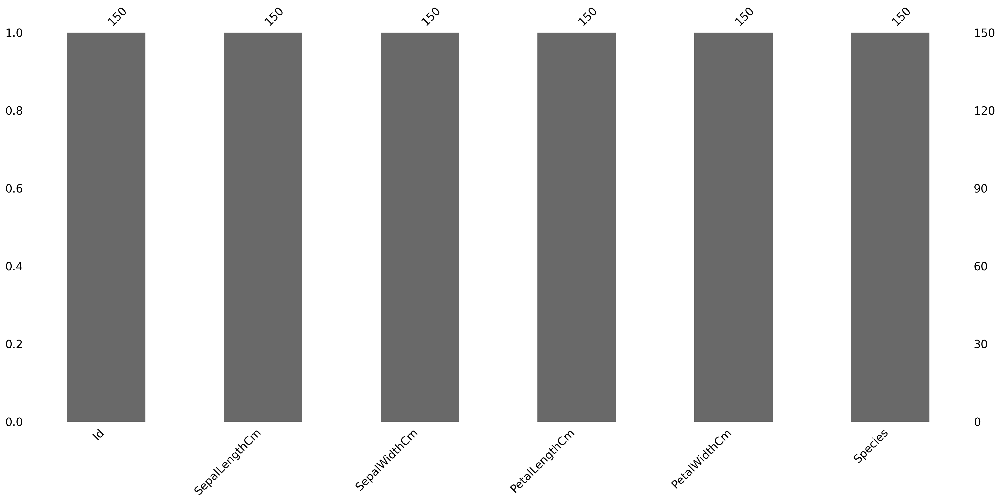

In [279]:
msno.bar(df)

In [280]:
df.describe().T.iloc[0:, 1:].style.background_gradient(cmap=pal)

,mean,std,min,25%,50%,75%,max
Id,75.500000,43.445368,1.000000,38.250000,75.500000,112.750000,150.000000
SepalLengthCm,5.843333,0.828066,4.300000,5.100000,5.800000,6.400000,7.900000
SepalWidthCm,3.054000,0.433594,2.000000,2.800000,3.000000,3.300000,4.400000
PetalLengthCm,3.758667,1.764420,1.000000,1.600000,4.350000,5.100000,6.900000
PetalWidthCm,1.198667,0.763161,0.100000,0.300000,1.300000,1.800000,2.500000


### Data Vizualization

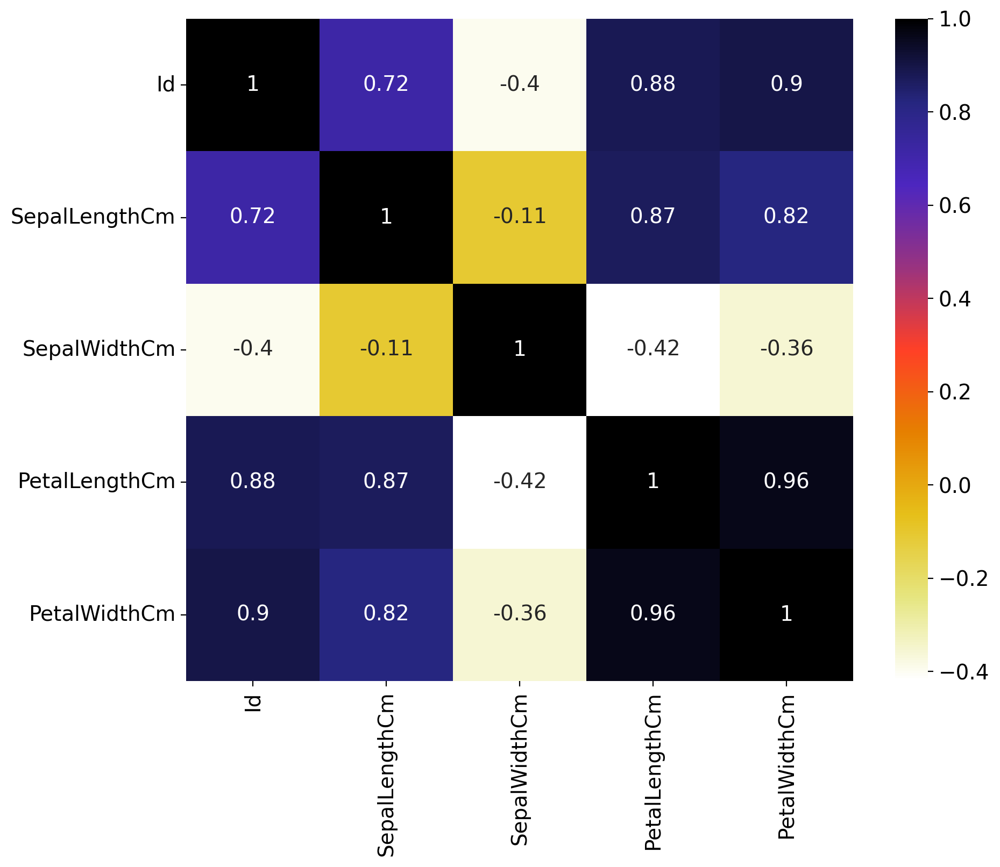

In [281]:
pl.figure(figsize=(10,8))
sns.heatmap(df.corr(), annot=True, cmap=pal)
pl.show()

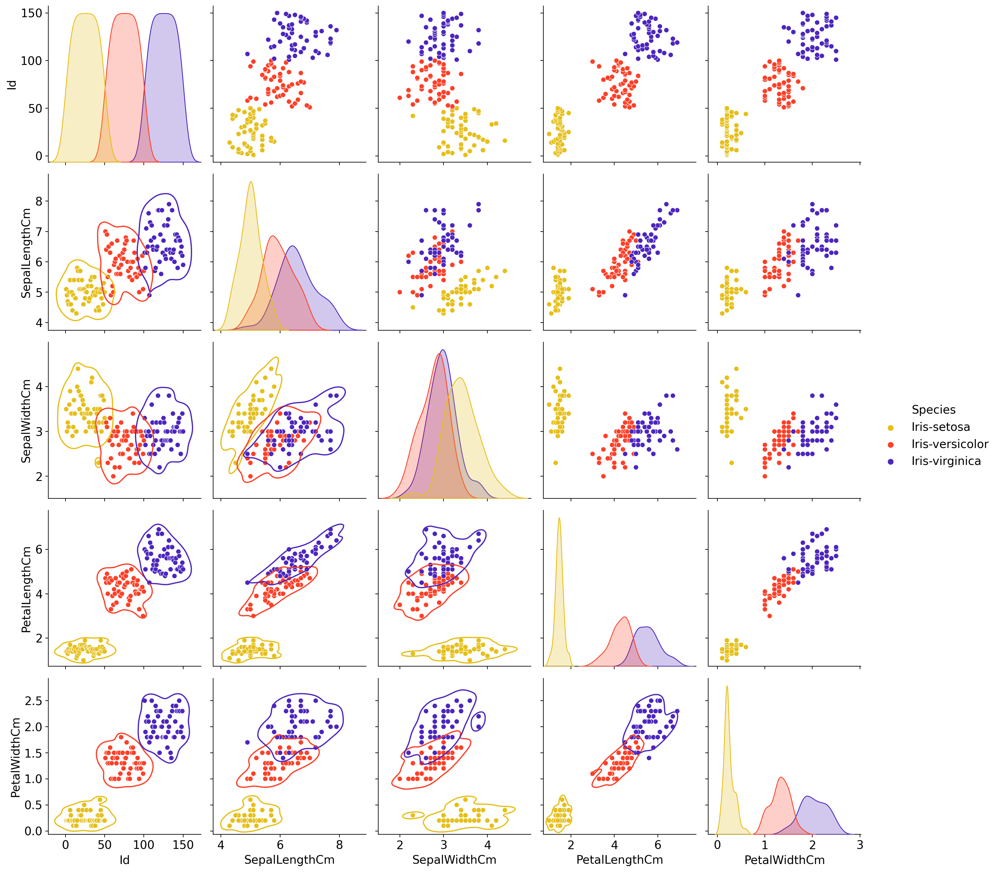

In [282]:
sns.pairplot(df, hue='Species', palette=pal, height=3).map_lower(sns.kdeplot, levels=2)
pl.show()

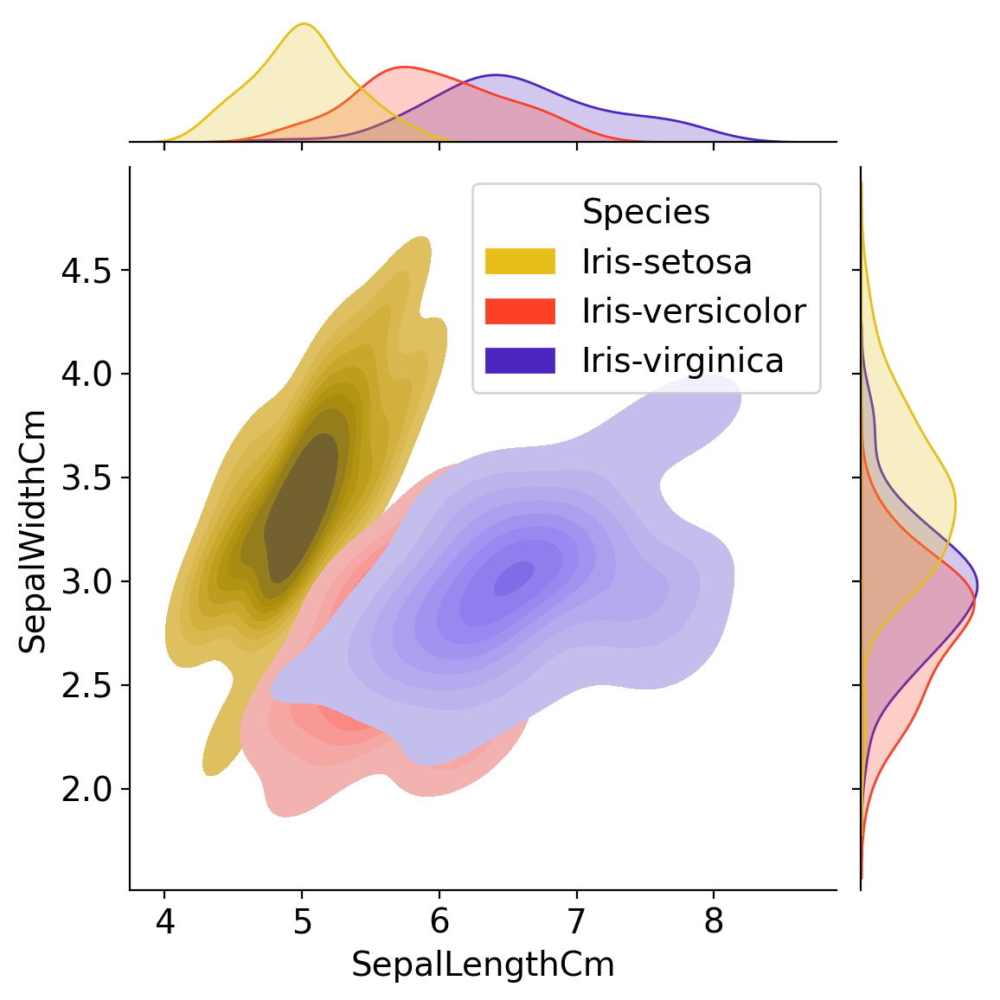

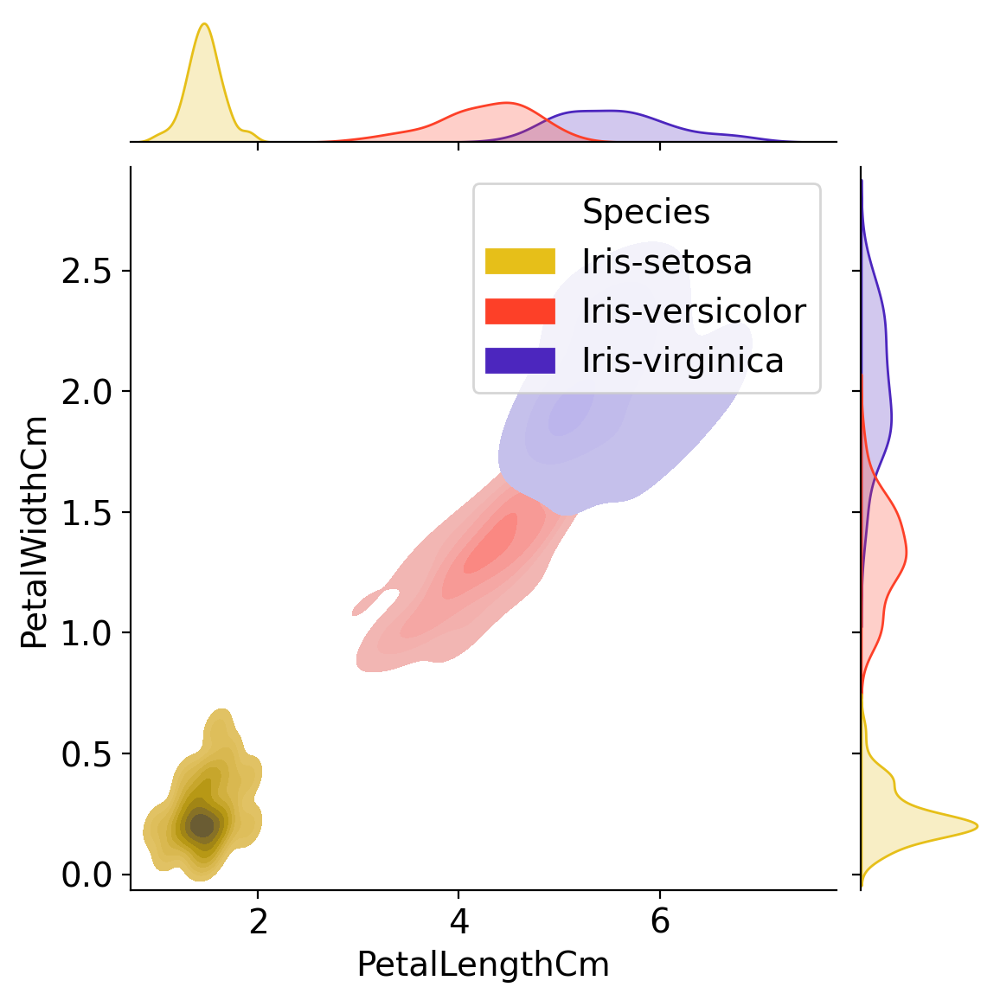

In [283]:
sns.jointplot(x='SepalLengthCm', y='SepalWidthCm', kind="kde", fill=True, palette=pal, hue='Species', data=df)
sns.jointplot(x='PetalLengthCm', y='PetalWidthCm', kind="kde", fill=True, palette=pal, hue='Species', data=df)

pl.show()

  0%|                                                                                         | 0/1083 [00:00<…

DataPrep Report
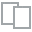
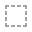
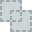
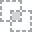
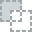
...
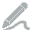
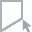
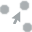
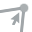
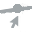

In [284]:
create_report(df)

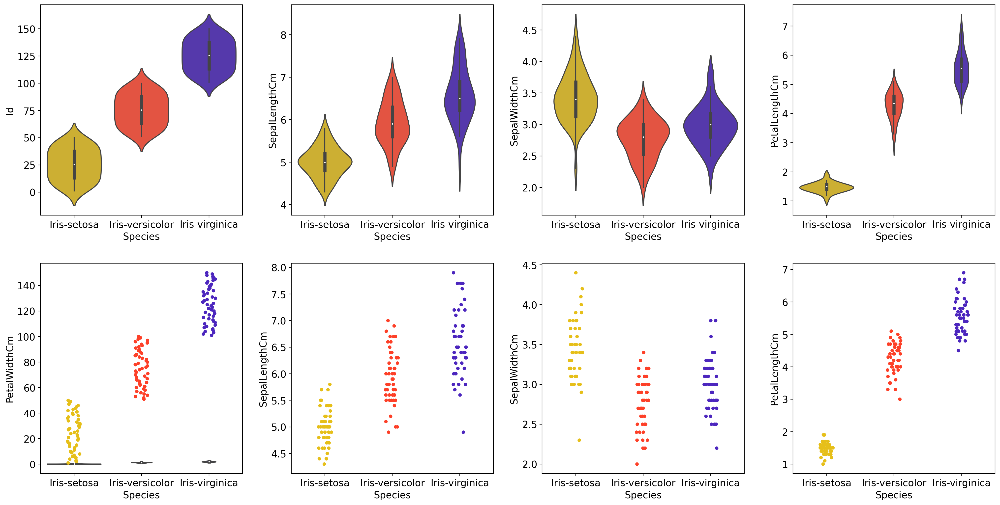

In [285]:
fig, axes = pl.subplots(2, 4, figsize=fs)

# Viol
for ax, col in zip(axes.flatten(), df.columns[:-1]):
    sns.violinplot(x='Species', y=col, palette=pal, data=df, ax=ax)
    
# Strip 
for ax, col in zip(axes.flatten()[4:], df.columns[:-1]):
    sns.stripplot(x='Species', y=col, palette=pal, data=df, ax=ax)
    
pl.tight_layout(pad=0, w_pad=1.5, h_pad=2)
pl.show()

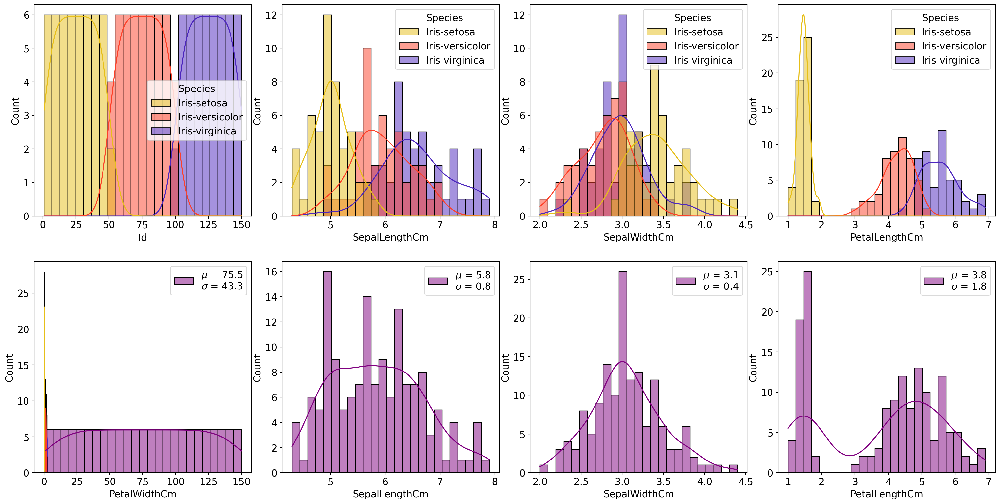

In [286]:
fig, axes = pl.subplots(2, 4, figsize=fs)

# Categorized
for ax, col in zip(axes.flatten(), df.columns[:-1]):
    sns.histplot(data=df, x=col, kde=True, bins=25, hue='Species', palette=pal, ax=ax)

# Total
for ax, col in zip(axes.flatten()[4:], df.columns[:-1]):
    mu, sigma = norm.fit(df[col])
    sns.histplot(data=df, x=col, kde=True, bins=25, color='purple', ax=ax, label=f'$\mu$ = {mu:.1f}\n$\sigma$ = {sigma:.1f}')
    ax.legend()
    
pl.tight_layout(pad=0, w_pad=0, h_pad=2)
pl.show()

In [287]:
scatter_matrix(df, dimensions=df.columns[:-1], color='Species', color_discrete_sequence=['yellow', 'red', 'purple'])

In [288]:
parallel_categories(df)

In [289]:
scatter_3d(x='PetalLengthCm', y='PetalWidthCm', z='SepalLengthCm', color='Species', 
           color_discrete_sequence=['yellow', 'red', 'purple'], data_frame=df).show()

In [290]:
scatter_3d(x='PetalLengthCm', y='PetalWidthCm', z='SepalWidthCm', color='Species',
           color_discrete_sequence=['yellow', 'red', 'purple'], data_frame=df).show()

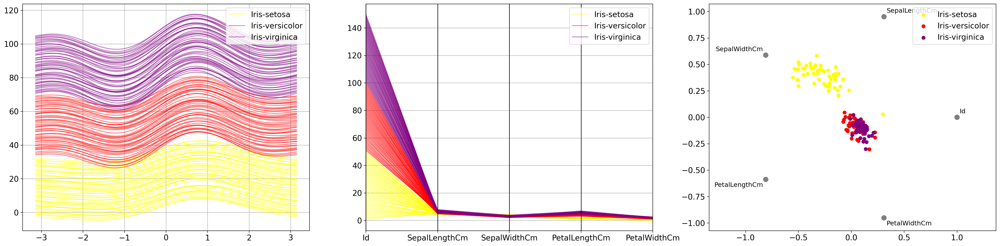

In [291]:
def AV_plots():

    fig, ax = pl.subplots(1, 3, figsize=(25,6))
    
    # Andrews Curves
    andrews_curves(frame=df, class_column="Species", color=['yellow','red','purple'], alpha=0.5, ax=ax[0])
    
    # Parallel Coordinates
    parallel_coordinates(frame=df, class_column="Species", color=['yellow','red','purple'], alpha=0.5, ax=ax[1])
    
    # Radviz
    radviz(frame=df, class_column="Species", color=['yellow','red','purple'], ax=ax[2])
    pl.tight_layout(pad=0, w_pad=0.2, h_pad=0)
    pl.show()
    
AV_plots()

In [292]:
col_names = ['Iris-setosa', 'Iris-versicolor', 'Iris-virginica']
ac_list = []
model_names = []

In [293]:
## Confusion Matrix Plot true vs pred values  ##

def CM(y_test, y_pred_test, col_names, model='model', fs=(8,6)):
    pl.rcParams.update({'font.size': 14})
    c_matrix = confusion_matrix(y_test, y_pred_test)
    pl.figure(figsize=fs)
    sns.heatmap(c_matrix, annot=True, annot_kws={'size':15}, fmt=".0f", cmap=pl.cm.Purples, linewidths=5)
    
    tick_marks = np.arange(len(col_names))
    pl.xticks(tick_marks + 0.5, col_names)
    pl.yticks(tick_marks + 0.5, col_names, rotation=0)
    pl.xlabel('Predicted label')
    pl.ylabel('True label')
    pl.title(f'Confusion Matrix for {model} Model')
    pl.show()

### Data Split into X & Y

In [294]:
x = df.drop('Species', axis=1)
y = df['Species']

In [295]:
x

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm
0,1,5.1,3.5,1.4,0.2
1,2,4.9,3.0,1.4,0.2
2,3,4.7,3.2,1.3,0.2
3,4,4.6,3.1,1.5,0.2
4,5,5.0,3.6,1.4,0.2
...,...,...,...,...,...
145,146,6.7,3.0,5.2,2.3
146,147,6.3,2.5,5.0,1.9
147,148,6.5,3.0,5.2,2.0
148,149,6.2,3.4,5.4,2.3


In [296]:
y

0         Iris-setosa
1         Iris-setosa
2         Iris-setosa
3         Iris-setosa
4         Iris-setosa
            ...      
145    Iris-virginica
146    Iris-virginica
147    Iris-virginica
148    Iris-virginica
149    Iris-virginica
Name: Species, Length: 150, dtype: object

In [297]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, random_state=50)

In [298]:
print(f'Shapes | X - Train: {x_train.shape}\t | X - Test {x_test.shape}')
print(f'Shapes | Y - Train: {y_train.shape}\t | Y - Test {y_test.shape}')

Shapes | X - Train: (135, 5)	 | X - Test (15, 5)
Shapes | Y - Train: (135,)	 | Y - Test (15,)


In [299]:
display(x_train.head(), x_test.head())

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm
25,26,5.0,3.0,1.6,0.2
82,83,5.8,2.7,3.9,1.2
48,49,5.3,3.7,1.5,0.2
81,82,5.5,2.4,3.7,1.0
77,78,6.7,3.0,5.0,1.7


,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm
88,89,5.6,3.0,4.1,1.3
72,73,6.3,2.5,4.9,1.5
20,21,5.4,3.4,1.7,0.2
16,17,5.4,3.9,1.3,0.4
147,148,6.5,3.0,5.2,2.0


### Standard Scaler

In [300]:
sc = StandardScaler()

x_train_ss = sc.fit_transform(x_train)
x_test_ss = sc.transform(x_test)

In [301]:
display(pd.DataFrame(x_train_ss).head(), pd.DataFrame(x_test_ss).head())

,0,1,2,3,4
0,-1.160384,-1.012433,-0.138043,-1.238384,-1.326964
1,0.166188,-0.052444,-0.828257,0.072623,-0.002942
2,-0.625101,-0.652437,1.472457,-1.295384,-1.326964
3,0.142915,-0.412440,-1.518472,-0.041378,-0.267747
4,0.049822,1.027544,-0.138043,0.699625,0.659069


,0,1,2,3,4
0,0.305827,-0.292441,-0.138043,0.186623,0.129460
1,-0.066544,0.547549,-1.288400,0.642625,0.394264
2,-1.276750,-0.532438,0.782243,-1.181383,-1.326964
3,-1.369843,-0.532438,1.932600,-1.409384,-1.062160
4,1.678945,0.787547,-0.138043,0.813626,1.056275


In [302]:
print(f'{y_train.head()}\n\
      \n{y_test.head()}')

25        Iris-setosa
82    Iris-versicolor
48        Iris-setosa
81    Iris-versicolor
77    Iris-versicolor
Name: Species, dtype: object
      
88     Iris-versicolor
72     Iris-versicolor
20         Iris-setosa
16         Iris-setosa
147     Iris-virginica
Name: Species, dtype: object


In [303]:
pd.DataFrame( y_test.value_counts())

,Species
Iris-setosa,6
Iris-virginica,5
Iris-versicolor,4


### Model Building

In [304]:
mlr = LogisticRegression(multi_class='multinomial', random_state=0)

In [305]:
mlr.fit(x_train, y_train)

LogisticRegression(multi_class='multinomial', random_state=0)

### Prediction

In [306]:
pred = mlr.predict(x_test)

In [307]:
pred

array(['Iris-versicolor', 'Iris-versicolor', 'Iris-setosa', 'Iris-setosa',
       'Iris-virginica', 'Iris-virginica', 'Iris-virginica',
       'Iris-setosa', 'Iris-setosa', 'Iris-versicolor', 'Iris-setosa',
       'Iris-virginica', 'Iris-setosa', 'Iris-virginica',
       'Iris-versicolor'], dtype=object)

In [308]:
len(pred)

15

In [309]:
mlr.fit(x_train_ss, y_train)
pred = mlr.predict(x_test_ss)

### Model Evaluation

In [310]:
acc = accuracy_score(y_test, pred)
ac_list.append(acc)
model_names.append('MLR')

print(f'Accuracy Score: {acc:.3f}')

Accuracy Score: 1.000


In [311]:
pred_df = pd.DataFrame(pd.Series(pred).value_counts(), columns=['Test Outcome'])
pd.concat([y_test.value_counts(), pred_df], axis=1)

,Species,Test Outcome
Iris-setosa,6,6
Iris-virginica,5,5
Iris-versicolor,4,4


In [312]:
print(f'Intercept: \n {mlr.intercept_}')

Intercept: 
 [-0.3128716   2.12824911 -1.81537751]


In [313]:
print(f'Coefficients: \n {mlr.coef_}')

Coefficients: 
 [[-1.2098309  -0.93714918  0.94795707 -1.55351754 -1.45129876]
 [-0.94824542  0.39636655 -0.40212924  0.11918713 -0.29972055]
 [ 2.15807631  0.54078263 -0.54582783  1.43433041  1.75101932]]


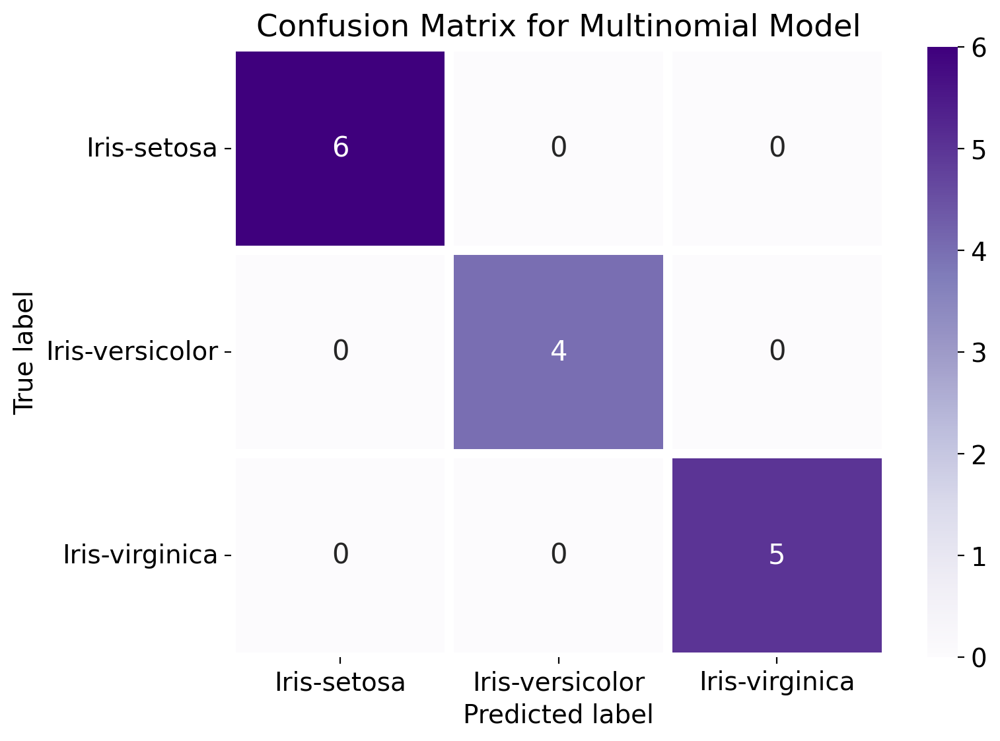

In [314]:
CM(y_test, pred, col_names=col_names, model='Multinomial')

In [315]:
print(classification_report(y_test, pred))

                 precision    recall  f1-score   support

    Iris-setosa       1.00      1.00      1.00         6
Iris-versicolor       1.00      1.00      1.00         4
 Iris-virginica       1.00      1.00      1.00         5

       accuracy                           1.00        15
      macro avg       1.00      1.00      1.00        15
   weighted avg       1.00      1.00      1.00        15

